# Install Library DeepFace

In [ ]:
pip install deepface

# Parameter Setting

In [ ]:
# Import
from deepface import DeepFace
import math
from math import ceil
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import cv2
import os
from IPython.display import display
from PIL import Image
import glob

# FOLDER foto referensi dan test
ref_path = "ref2"
test_path = "test2"
ref = []
test = []
for filename in (glob.glob(ref_path + '/*.jpg') + glob.glob(ref_path + '/*.jpeg') + glob.glob(ref_path + '/*.png') + 
                 glob.glob(ref_path + '/*.jfif')):
    ref.append(filename)
for filename in (glob.glob(test_path + '/*.jpg') + glob.glob(test_path + '/*.jpeg') + glob.glob(test_path + '/*.png') + 
                 glob.glob(test_path + '/*.jfif')):
    test.append(filename)

# List Parameter
models = ["VGG-Face", "Facenet", "Facenet512", "OpenFace", "DeepFace", "DeepID", "ArcFace", "Dlib", "SFace"]
distances = ["cosine", "euclidean", "euclidean_l2"]
backends = ['opencv', 'ssd', 'Dlib', 'mtcnn', 'retinaface', 'mediapipe']

# Selected Parameter
model = models[2]
distance = distances[0]
backend = backends[3]
force_match = False
#threshold = 0.45



# Ringkasan File Gambar Sumber

In [ ]:
size = len(ref)
cols = 5
rows = ceil(size/5)
i=0
print("jumlah file referensi: ", size)

fig_ref = plt.figure(figsize=(50,100))
plt.rcParams.update({'font.size': 35})

for sumber in ref:
    i = i + 1
    fig_ref.add_subplot(rows, cols, i)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(np.squeeze(plt.imread(sumber)), cmap=plt.cm.binary)
    plt.xlabel(sumber)

# Ringkasan File Gambar Test

In [ ]:
size = len(test)
cols = 5
rows = ceil(size/5)
i=0
print("jumlah file test: ", size)

fig_test = plt.figure(figsize=(50,100))
plt.rcParams.update({'font.size': 35})

for tujuan in test:
    i = i + 1
    fig_test.add_subplot(rows, cols, i)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(np.squeeze(plt.imread(tujuan)), cmap=plt.cm.binary)
    plt.xlabel(os.path.basename(tujuan))

# Menjalankan fungsi find dengan konfigurasi tertentu untuk setiap sumber data 

In [ ]:
# Deklarasi Array
arrsumber = []
arrsumbertext = []
arrtujuan = []
arrtujuantext = []
arrhasil = []

# Numbering Counter
i = 0

# Loop Matching Setiap File Referensi ke Semua File Test
for sumber in ref:
    match = DeepFace.find(img_path = sumber, db_path = test_path, enforce_detection = force_match, model_name = model, 
                          distance_metric = distance, detector_backend = backend)
    
    # Breakdown Hasil Matching
    i+=1
    arrsumber.append(cv2.cvtColor(cv2.imread(sumber, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB))
    arrsumbertext.append(sumber)
    
    if match.size > 0:
        arrtujuan.append(cv2.cvtColor(cv2.imread(match["identity"][0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB))
        arrtujuantext.append(match["identity"][0])
        arrhasil.append("MATCH")
    else:
        arrtujuan.append(np.zeros((100,100,3), np.uint8))
        arrtujuantext.append("UNKNOWN")
        arrhasil.append("UNMATCH")

# Menampilkan hasil matching wajah untuk setiap foto di folder "ref"

model:  Facenet512
distance:  cosine
backend:  mtcnn


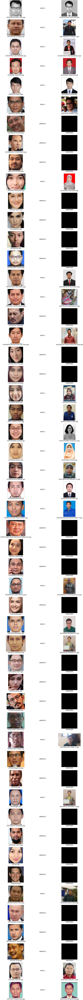

In [4]:
rows = i
columns = 3
fig = plt.figure(figsize=(30, 400))
plt.rcParams.update({'font.size': 30})

for x in range(rows):
    fig.add_subplot(rows,columns,x*3+1)
    plt.imshow(arrsumber[x])
    plt.xlabel(arrsumbertext[x])
    plt.xticks([])
    plt.yticks([])

    fig.add_subplot(rows,columns,x*3+2)
    plt.text(0.5, 0.5, arrhasil[x], ha='center', va='center')
    plt.axis('off')

    fig.add_subplot(rows,columns,x*3+3)
    plt.imshow(arrtujuan[x])
    plt.xlabel(arrtujuantext[x])
    plt.xticks([])
    plt.yticks([])

print ("model: ", model)
print ("distance: ", distance)
print ("backend: ", backend)
plt.show()  